In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import keras
from keras.layers import Dense, Dropout, Input
from keras.models import Model,Sequential
from keras.datasets import mnist
from tqdm import tqdm
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam


# Building

In [11]:
def load_data():
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = (x_train.astype(np.float32) - 127.5)/127.5
    
    # convert shape of x_train from (60000, 28, 28) to (60000, 784) 
    # 784 columns per row
    x_train = x_train.reshape(60000, 784)
    return (x_train, y_train, x_test, y_test)
(X_train, y_train,X_test, y_test)=load_data()
print(X_train.shape)


(60000, 784)


In [12]:
def adam_optimizer():
    return Adam(lr=0.0002, beta_1=0.5)


In [13]:
def create_generator():
    generator=Sequential()
    generator.add(Dense(units=256,input_dim=100))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=512))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=1024))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=784, activation='tanh'))
    
    generator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return generator
g=create_generator()
g.summary()


Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_25 (Dense)             (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_27 (Dense)             (None, 1024)              525312    
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 1024)              0         
_________________________________________________________________
dense_28 (Dense)             (None, 784)              

In [14]:
def create_discriminator():
    discriminator=Sequential()
    discriminator.add(Dense(units=1024,input_dim=784))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
       
    
    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
       
    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Dense(units=1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return discriminator
d =create_discriminator()
d.summary()


Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_29 (Dense)             (None, 1024)              803840    
_________________________________________________________________
leaky_re_lu_22 (LeakyReLU)   (None, 1024)              0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_30 (Dense)             (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_23 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_31 (Dense)             (None, 256)              

In [15]:
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam')
    return gan
gan = create_gan(d,g)
gan.summary()


Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 100)               0         
_________________________________________________________________
sequential_7 (Sequential)    (None, 784)               1486352   
_________________________________________________________________
sequential_8 (Sequential)    (None, 1)                 1460225   
Total params: 2,946,577
Trainable params: 1,486,352
Non-trainable params: 1,460,225
_________________________________________________________________


In [16]:
def plot_generated_images(epoch, generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(100,28,28)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image %d.png' %epoch)


# Training 

In [17]:
def training(epochs=1, batch_size=128):
    
    #Loading the data
    (X_train, y_train, X_test, y_test) = load_data()
    batch_count = X_train.shape[0] / batch_size
    
    # Creating GAN
    generator= create_generator()
    discriminator= create_discriminator()
    gan = create_gan(discriminator, generator)
    
    for e in range(1,epochs+1 ):
        print("Epoch %d" %e)
        for _ in tqdm(range(batch_size)):
        #generate  random noise as an input  to  initialize the  generator
            noise= np.random.normal(0,1, [batch_size, 100])
            
            # Generate fake MNIST images from noised input
            generated_images = generator.predict(noise)
            
            # Get a random set of  real images
            image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
            
            #Construct different batches of  real and fake data 
            X= np.concatenate([image_batch, generated_images])
            
            # Labels for generated and real data
            y_dis=np.zeros(2*batch_size)
            y_dis[:batch_size]=0.9
            
            #Pre train discriminator on  fake and real data  before starting the gan. 
            discriminator.trainable=True
            discriminator.train_on_batch(X, y_dis)
            
            #Tricking the noised input of the Generator as real data
            noise= np.random.normal(0,1, [batch_size, 100])
            y_gen = np.ones(batch_size)
            
            # During the training of gan, 
            # the weights of discriminator should be fixed. 
            #We can enforce that by setting the trainable flag
            discriminator.trainable=False
            
            #training  the GAN by alternating the training of the Discriminator 
            #and training the chained GAN model with Discriminator’s weights freezed.
            gan.train_on_batch(noise, y_gen)
            
        if e == 1 or e % 20 == 0:
           
            plot_generated_images(e, generator)



Epoch 1




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:04<09:37,  4.55s/it]

  2%|█▎                                                                                | 2/128 [00:04<06:46,  3.23s/it]

  2%|█▉                                                                                | 3/128 [00:04<04:47,  2.30s/it]

  3%|██▌                                                                               | 4/128 [00:05<03:25,  1.66s/it]

  4%|███▏                                                                              | 5/128 [00:05<02:28,  1.21s/it]

  5%|███▊                                                                              | 6/128 [00:05<01:48,  1.13it/s]

  5%|████▍                                                                             | 7/128 [00:05<01:21,  1.49it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:09,  6.52it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:09,  6.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:09,  6.34it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:15<00:09,  6.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:15<00:08,  6.38it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:08,  6.97it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:07,  7.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:07,  6.94it/s]

 59%|███████████████████████████

Epoch 2




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.47it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.50it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.45it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.19it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.04it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.19it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.73it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  6.71it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  6.92it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  6.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  7.03it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.41it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.78it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.55it/s]

 59%|███████████████████████████

Epoch 3




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.73it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.70it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.73it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.64it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.66it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.25it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.28it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.17it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.19it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.23it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.23it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.33it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.32it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.35it/s]

 59%|███████████████████████████

Epoch 4




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.89it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.10it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:19,  6.45it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:20,  5.97it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:21,  5.62it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  6.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:10<00:08,  7.02it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:07,  7.43it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:07,  7.41it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.40it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.54it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  7.78it/s]

 59%|███████████████████████████

Epoch 5




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.65it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.82it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.86it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.78it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.89it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.06it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.36it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.58it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.04it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.13it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.44it/s]

 59%|███████████████████████████

Epoch 6




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.96it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.25it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.01it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.62it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.07it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.41it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.70it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.34it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.26it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.35it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.36it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.37it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.49it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.45it/s]

 59%|███████████████████████████

Epoch 7




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.05it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.76it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.36it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.72it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.05it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.07it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.98it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.12it/s]

 59%|███████████████████████████

Epoch 8




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.28it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.38it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.15it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.86it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.51it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  7.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  7.99it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:07,  8.26it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.39it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.49it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.60it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.53it/s]

 59%|███████████████████████████

Epoch 9




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.55it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.52it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.45it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.53it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.38it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.05it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.22it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.34it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.35it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.18it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.17it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.19it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.08it/s]

 59%|███████████████████████████

Epoch 10




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.00it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.70it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.45it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.33it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.27it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.81it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:10,  5.55it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:10,  5.74it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:09,  6.07it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:09,  6.22it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:08,  6.50it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:08,  6.63it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:08,  6.44it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:08,  6.32it/s]

 59%|███████████████████████████

Epoch 11




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.42it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.46it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.45it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.51it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.55it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.54it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  6.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:09,  6.32it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:09,  5.94it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:10,  5.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:10,  5.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:11,  4.96it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:11,  4.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:11,  4.76it/s]

 59%|███████████████████████████

Epoch 12




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:25,  5.01it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  4.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:27,  4.59it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:28,  4.38it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:28,  4.35it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:27,  4.44it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:26,  4.59it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  5.03it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:11,  5.15it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:11,  5.26it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:13<00:11,  5.27it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:10,  5.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:10,  5.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:10,  5.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:14<00:09,  5.48it/s]

 59%|███████████████████████████

Epoch 13




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:24,  5.18it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:24,  5.14it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:25,  4.82it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:25,  4.85it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.82it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:25,  4.82it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:25,  4.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:15<00:12,  5.05it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:16<00:11,  5.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:16<00:11,  5.06it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:16<00:11,  5.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:16<00:11,  5.00it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:16<00:11,  5.07it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:17<00:10,  5.14it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:17<00:10,  4.97it/s]

 59%|███████████████████████████

Epoch 14




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:28,  4.48it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:27,  4.59it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:26,  4.67it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:26,  4.76it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.84it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:25,  4.87it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  4.92it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:06,  9.16it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:06,  9.17it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:06,  9.23it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:06,  9.30it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:06,  9.24it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:06,  9.31it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:05,  9.31it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:05,  9.29it/s]

 59%|███████████████████████████

Epoch 15




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.56it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.56it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.66it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.85it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.00it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.28it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.31it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.30it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.35it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.27it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.36it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.36it/s]

 59%|███████████████████████████

Epoch 16




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.49it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.45it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.46it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.35it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.33it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.37it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.29it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.24it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.33it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.38it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.47it/s]

 59%|███████████████████████████

Epoch 17




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.76it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.67it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.55it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:12,  9.58it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.54it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.52it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.39it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.32it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.36it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.42it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.40it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.34it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.32it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.34it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.44it/s]

 59%|███████████████████████████

Epoch 18




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.45it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.44it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.43it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.47it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.38it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.35it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.48it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.41it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.36it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.37it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.35it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.22it/s]

 59%|███████████████████████████

Epoch 19




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.55it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.56it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.49it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.47it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.39it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.46it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.41it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.48it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.37it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.39it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.40it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.41it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.42it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.48it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.40it/s]

 59%|███████████████████████████

Epoch 20




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.40it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.44it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.49it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.40it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.39it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.33it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.45it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.43it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.41it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.30it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.30it/s]

 59%|███████████████████████████

Epoch 21




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:12,  9.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.63it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:12,  9.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:12,  9.68it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.56it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.64it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.29it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.45it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.54it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.56it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:05,  9.50it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.54it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.60it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.58it/s]

 59%|███████████████████████████

Epoch 22




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:12,  9.93it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:12,  9.73it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:12,  9.68it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:12,  9.65it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.62it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.49it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.47it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.15it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.02it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.02it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.06it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.10it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.18it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:06,  8.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.13it/s]

 59%|███████████████████████████

Epoch 23




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.33it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.33it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.33it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.36it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.39it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.44it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.42it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.60it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.59it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.45it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.20it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.20it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.25it/s]

 59%|███████████████████████████

Epoch 24




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.06it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.16it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.35it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.45it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.47it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.43it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.40it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.44it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:05,  9.50it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.54it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.57it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.57it/s]

 59%|███████████████████████████

Epoch 25




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.22it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.24it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.36it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.61it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.78it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.83it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.23it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.25it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.32it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.27it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.25it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.23it/s]

 59%|███████████████████████████

Epoch 26




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.67it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.61it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.64it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.84it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.00it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.01it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.51it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.45it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.40it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.35it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.42it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.45it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.50it/s]

 59%|███████████████████████████

Epoch 27




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.41it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.42it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.49it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.27it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.32it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.32it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.46it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.52it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:05,  9.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.49it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.43it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.44it/s]

 59%|███████████████████████████

Epoch 28




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.73it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.57it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.53it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.48it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.48it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.50it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.04it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.03it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.09it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:07,  8.05it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.06it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.07it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.07it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.14it/s]

 59%|███████████████████████████

Epoch 29




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.13it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.91it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.78it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.69it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.79it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.93it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.74it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.95it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.92it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.05it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.05it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.08it/s]

 59%|███████████████████████████

Epoch 30




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.64it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.59it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.52it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.52it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.37it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.45it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.44it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.42it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.35it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.38it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.43it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.34it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.43it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.46it/s]

 59%|███████████████████████████

Epoch 31




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.50it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.46it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.38it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.49it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.50it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.54it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.38it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.37it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.44it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.42it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.40it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.50it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.54it/s]

 59%|███████████████████████████

Epoch 32




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:12,  9.73it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:12,  9.71it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:12,  9.63it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.55it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.47it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.52it/s]

  6%|█████▏                                                                            | 8/128 [00:00<00:12,  9.40it/s]

  7%|█████▊                   

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.74it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.80it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:05,  9.18it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.29it/s]

 59%|███████████████████████████████████████████████▍                                 | 75/128 [00:08<00:05,  9.31it/s]

 59%|███████████████████████████

Epoch 33




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.59it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.57it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:12,  9.55it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.48it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.53it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.51it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.47it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.43it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.44it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.39it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.44it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.46it/s]

 59%|███████████████████████████

Epoch 34




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.92it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.91it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.95it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.92it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.70it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.73it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.93it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.92it/s]

 59%|███████████████████████████

Epoch 35




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.61it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.59it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.50it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.42it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.43it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.39it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.18it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.30it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.27it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.27it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.34it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.26it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.27it/s]

 59%|███████████████████████████

Epoch 36




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.55it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.48it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.39it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.47it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.46it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.46it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.38it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.34it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.37it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.40it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.36it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.27it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.30it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.32it/s]

 59%|███████████████████████████

Epoch 37




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.07it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.08it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.09it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.15it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.19it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.19it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.53it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.55it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.69it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.70it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  8.70it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.75it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.77it/s]

 59%|███████████████████████████

Epoch 38




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.67it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.57it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.50it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.54it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.76it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.26it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.24it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.10it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.08it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.17it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.10it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.16it/s]

 59%|███████████████████████████

Epoch 39




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.44it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.36it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.31it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.23it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.24it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.28it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.21it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.16it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.18it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.21it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.21it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.21it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.18it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.10it/s]

 59%|███████████████████████████

Epoch 40




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.22it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.29it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.28it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.31it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.32it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.94it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  8.83it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.82it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.77it/s]

 59%|███████████████████████████

Epoch 41




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.93it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.91it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.92it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.91it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.86it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.14it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.87it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.96it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.03it/s]

 59%|███████████████████████████

Epoch 42




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.98it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.05it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.97it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.70it/s]

  5%|████▍                                                                             | 7/128 [00:02<00:47,  2.55it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.65it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:06,  8.78it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:06,  8.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:06,  8.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.83it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.86it/s]

 59%|███████████████████████████

Epoch 43




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.36it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.94it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.01it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.02it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.89it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.97it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.99it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.93it/s]

 59%|███████████████████████████

Epoch 44




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.40it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.35it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.31it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.30it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.40it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.56it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.93it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.92it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.01it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.87it/s]

 59%|███████████████████████████

Epoch 45




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.02it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.02it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.00it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.99it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.95it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.03it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.93it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.01it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.09it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.04it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.07it/s]

 59%|███████████████████████████

Epoch 46




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.26it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.29it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.29it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.29it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.19it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.51it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.47it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.44it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.39it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.24it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.33it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.22it/s]

 59%|███████████████████████████

Epoch 47




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:32,  3.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:32,  3.94it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:32,  3.89it/s]

  3%|██▌                                                                               | 4/128 [00:01<00:32,  3.81it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:32,  3.81it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:32,  3.78it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:31,  3.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:11<00:06,  9.09it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:11<00:06,  9.12it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:11<00:06,  9.22it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:11<00:06,  9.11it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:11<00:06,  8.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:11<00:06,  8.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:11<00:06,  8.59it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:11<00:06,  8.54it/s]

 59%|███████████████████████████

Epoch 48




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.49it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.38it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.43it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.06it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.12it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.25it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.52it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.55it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.48it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.46it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.38it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.30it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.37it/s]

 59%|███████████████████████████

Epoch 49




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.22it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.32it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.33it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.37it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.45it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.37it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.44it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.42it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.35it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.44it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.42it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.36it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.33it/s]

 59%|███████████████████████████

Epoch 50




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.55it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.49it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.38it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.46it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.46it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.51it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.50it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.49it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.44it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:05,  9.59it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.50it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.43it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.47it/s]

 59%|███████████████████████████

Epoch 51




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.41it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.43it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.47it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:12,  9.46it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.33it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.34it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.29it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.32it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.31it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.22it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.27it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.33it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.40it/s]

 59%|███████████████████████████

Epoch 52




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.51it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.47it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.49it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.46it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:12,  9.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:12,  9.46it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.22it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.12it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.31it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.63it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  8.68it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.79it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.82it/s]

 59%|███████████████████████████

Epoch 53




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.16it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.05it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.87it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.92it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  7.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.99it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.82it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.81it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  7.94it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.08it/s]

 59%|███████████████████████████

Epoch 54




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.90it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.91it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.97it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:06,  8.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  9.04it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  9.11it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.11it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.09it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.07it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.15it/s]

 59%|███████████████████████████

Epoch 55




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.77it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.58it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.69it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.95it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.17it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.20it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.25it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  9.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.23it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.30it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:05,  9.30it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.27it/s]

 59%|███████████████████████████

Epoch 56




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.05it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.07it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.18it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.21it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.16it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.21it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.32it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.31it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.33it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.29it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.34it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.39it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.36it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:07<00:05,  9.41it/s]

 59%|███████████████████████████

Epoch 57




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.42it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.34it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.38it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.35it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.38it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.20it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.12it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.15it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.14it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.08it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.07it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.01it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.95it/s]

 59%|███████████████████████████

Epoch 58




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.41it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.35it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.33it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.27it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.24it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.25it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.61it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.59it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.80it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.92it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.95it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.07it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.09it/s]

 59%|███████████████████████████

Epoch 59




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.55it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.54it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.38it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.25it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.18it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.01it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.97it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.11it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.16it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.12it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.08it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.98it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.89it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.84it/s]

 59%|███████████████████████████

Epoch 60




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.20it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.15it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.01it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.69it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.37it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.60it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.98it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.86it/s]

 59%|███████████████████████████

Epoch 61




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.28it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.60it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.62it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.05it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.07it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  7.99it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:08,  7.08it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.27it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.32it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.52it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.66it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  7.77it/s]

 59%|███████████████████████████

Epoch 62




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.85it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.90it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.81it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.00it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.94it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:06,  8.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.88it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.89it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.96it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:05,  9.02it/s]

 59%|███████████████████████████

Epoch 63




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.76it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.92it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.83it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.64it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.52it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.33it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.96it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.26it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.37it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.45it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.62it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.59it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.62it/s]

 59%|███████████████████████████

Epoch 64




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.05it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.83it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.89it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.36it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.05it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.34it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.40it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.54it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.48it/s]

 59%|███████████████████████████

Epoch 65




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.69it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.74it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.69it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.67it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.63it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.75it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.82it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.79it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.85it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.82it/s]

 59%|███████████████████████████

Epoch 66




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.60it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.65it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.76it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.46it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.59it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.62it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.71it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.79it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.41it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.51it/s]

 59%|███████████████████████████

Epoch 67




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.12it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.89it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.46it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.56it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.54it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.32it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.39it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.51it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.39it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.45it/s]

 59%|███████████████████████████

Epoch 68




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.29it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.14it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.01it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.91it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.64it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.66it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.52it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.61it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.61it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.71it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.76it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.74it/s]

 59%|███████████████████████████

Epoch 69




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.91it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.89it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.68it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.04it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.07it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.86it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.28it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.45it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.06it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.55it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.14it/s]

 59%|███████████████████████████

Epoch 70




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.47it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.50it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.44it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.21it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.23it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.03it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.07it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.06it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.11it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.03it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.89it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.91it/s]

 59%|███████████████████████████

Epoch 71




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.19it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.05it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.15it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.89it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:09,  6.40it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  6.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:08,  7.19it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.71it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.41it/s]

 59%|███████████████████████████

Epoch 72




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.32it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.46it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.64it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.67it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.65it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.74it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.20it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.19it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.09it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.62it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.83it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.16it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.32it/s]

 59%|███████████████████████████

Epoch 73




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.36it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.53it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.67it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.64it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.85it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.86it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.83it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.91it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.97it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.99it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  9.05it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.00it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.95it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.80it/s]

 59%|███████████████████████████

Epoch 74




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.71it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.77it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.92it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.92it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.77it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.45it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.44it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.59it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.62it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.73it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.81it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.76it/s]

 59%|███████████████████████████

Epoch 75




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.93it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.08it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.30it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.69it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.91it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.04it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.67it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.74it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.82it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.46it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.59it/s]

 59%|███████████████████████████

Epoch 76




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.74it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.73it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.40it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.81it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.76it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.61it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.55it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.28it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.15it/s]

 59%|███████████████████████████

Epoch 77




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.89it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.83it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.62it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.97it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.00it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.12it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.69it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.63it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.76it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.61it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.46it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.58it/s]

 59%|███████████████████████████

Epoch 78




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.57it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.73it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.46it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.30it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.07it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.40it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.43it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.47it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.63it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.85it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.63it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.47it/s]

 59%|███████████████████████████

Epoch 79




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.04it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.96it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.27it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.45it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.77it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.98it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.03it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.47it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.76it/s]

 59%|███████████████████████████

Epoch 80




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.01it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.10it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.13it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.05it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.01it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.19it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.17it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.22it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.40it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.41it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.54it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.48it/s]

 59%|███████████████████████████

Epoch 81




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.27it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.06it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.35it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.35it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.27it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.76it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.94it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.76it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.14it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.12it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.27it/s]

 59%|███████████████████████████

Epoch 82




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.79it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.85it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.79it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.23it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.43it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.56it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.70it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:06,  8.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.41it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.38it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.45it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  7.96it/s]

 59%|███████████████████████████

Epoch 83




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.60it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.42it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.29it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.33it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.44it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.62it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.63it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.55it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.64it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.69it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.68it/s]

 59%|███████████████████████████

Epoch 84




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.31it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.28it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.18it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.16it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.20it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.18it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:09,  6.77it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  6.77it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:08,  6.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:08,  7.03it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.91it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.00it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.70it/s]

 59%|███████████████████████████

Epoch 85




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.88it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.93it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.86it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.83it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.94it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.33it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.44it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.42it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.42it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.41it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.40it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.43it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.42it/s]

 59%|███████████████████████████

Epoch 86




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:19,  6.39it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:20,  6.25it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:20,  6.21it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:21,  5.86it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:19,  6.21it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.46it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  8.04it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.76it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:07,  7.61it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:07,  7.82it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.65it/s]

 59%|███████████████████████████

Epoch 87




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.88it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.23it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.35it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.53it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.75it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:09,  6.47it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:09,  6.35it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:09,  6.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:09,  6.17it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:08,  6.36it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  6.98it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  6.95it/s]

 59%|███████████████████████████

Epoch 88




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.54it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.54it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.59it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.79it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.41it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.94it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.00it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  7.97it/s]

 59%|███████████████████████████

Epoch 89




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:21,  5.78it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:20,  6.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:19,  6.52it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.77it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.88it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  6.95it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:17,  7.03it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.85it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.76it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.70it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.67it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.78it/s]

 59%|███████████████████████████

Epoch 90




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.88it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.85it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.94it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.06it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.99it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.53it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.27it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:08,  6.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.01it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:08,  6.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:08,  6.66it/s]

 59%|███████████████████████████

Epoch 91




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.94it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.94it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.85it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.94it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.04it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.78it/s]

 59%|███████████████████████████

Epoch 92




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.24it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.17it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.34it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.32it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.52it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.52it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.51it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.65it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.62it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.63it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.59it/s]

 59%|███████████████████████████

Epoch 93




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.65it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.16it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.12it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.18it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.25it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.33it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.09it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.01it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.01it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.08it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.18it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.14it/s]

 59%|███████████████████████████

Epoch 94




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.82it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.64it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.53it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.48it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.54it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.11it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  7.02it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.31it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.62it/s]

 59%|███████████████████████████

Epoch 95




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.60it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.74it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.62it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.27it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:08,  7.21it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.38it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.55it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.68it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.72it/s]

 59%|███████████████████████████

Epoch 96




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.79it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.80it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.75it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.81it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.77it/s]

 59%|███████████████████████████

Epoch 97




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.72it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.75it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.75it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.76it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.72it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.76it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:09,  6.44it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  6.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  6.68it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  6.80it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.98it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:08,  6.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:08,  6.18it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:08,  6.50it/s]

 59%|███████████████████████████

Epoch 98




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.65it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.55it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.18it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.35it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.28it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.13it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:08,  7.08it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.02it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.03it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.07it/s]

 59%|███████████████████████████

Epoch 99




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.89it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:18,  6.77it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.65it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.70it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.74it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.41it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.37it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:08,  7.20it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:07,  7.30it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.50it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.69it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.70it/s]

 59%|███████████████████████████

Epoch 100




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.96it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.45it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.36it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.16it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.03it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  7.06it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.08it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.17it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.21it/s]

 59%|███████████████████████████

Epoch 101




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.98it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.97it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.89it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.44it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.67it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.57it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.33it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.39it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.23it/s]

 59%|███████████████████████████

Epoch 102




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.95it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.67it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.62it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.90it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.73it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.77it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.74it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.50it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.63it/s]

 59%|███████████████████████████

Epoch 103




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  9.00it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.80it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.27it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.43it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.46it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.41it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.40it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.30it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.38it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.36it/s]

 59%|███████████████████████████

Epoch 104




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.43it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.56it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.38it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.05it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.86it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.62it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.30it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.08it/s]

 59%|███████████████████████████

Epoch 105




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.64it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.70it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.86it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.64it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.34it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.16it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.36it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.49it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.12it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.31it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.45it/s]

 59%|███████████████████████████

Epoch 106




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.18it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.89it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.84it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.92it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.98it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.99it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.98it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.93it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.77it/s]

 59%|███████████████████████████

Epoch 107




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.83it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.87it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.82it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.80it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.74it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.86it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.73it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.66it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.70it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.79it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.63it/s]

 59%|███████████████████████████

Epoch 108




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.98it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.96it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.70it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.68it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.67it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.75it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.65it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.76it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.68it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.62it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.69it/s]

 59%|███████████████████████████

Epoch 109




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.95it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.95it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.95it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.11it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.27it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.49it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.56it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.65it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.72it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.63it/s]

 59%|███████████████████████████

Epoch 110




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.60it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.54it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.43it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.10it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.95it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.07it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.24it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.33it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.23it/s]

 59%|███████████████████████████

Epoch 111




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.10it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.05it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.82it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.81it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.81it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.69it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.47it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.59it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.65it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.72it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.72it/s]

 59%|███████████████████████████

Epoch 112




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.16it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.10it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.08it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.99it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.93it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.89it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.96it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.94it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.96it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.97it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.78it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.78it/s]

 59%|███████████████████████████

Epoch 113




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.07it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.00it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.92it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.72it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.90it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.31it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.01it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.24it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.38it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.41it/s]

 59%|███████████████████████████

Epoch 114




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.83it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.86it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.82it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.70it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.70it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.51it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.23it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.41it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.63it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.77it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.80it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.87it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.94it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.74it/s]

 59%|███████████████████████████

Epoch 115




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.29it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.18it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.13it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.34it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.41it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.52it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.41it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.32it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.41it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.31it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.75it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.79it/s]

 59%|███████████████████████████

Epoch 116




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.62it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.59it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.56it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.57it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.81it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.11it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.16it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.14it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.24it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.09it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.29it/s]

 59%|███████████████████████████

Epoch 117




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.83it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.71it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.69it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.74it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.38it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.10it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.93it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.49it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.71it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  7.93it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.09it/s]

 59%|███████████████████████████

Epoch 118




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.60it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.62it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.50it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.54it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.59it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.56it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.49it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.55it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.63it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.71it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.81it/s]

 59%|███████████████████████████

Epoch 119




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.67it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.70it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.66it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.74it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  7.67it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  7.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.05it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.08it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.32it/s]

 59%|███████████████████████████

Epoch 120




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.35it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.20it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.37it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.49it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.56it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.59it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.52it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.49it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.72it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.58it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.66it/s]

 59%|███████████████████████████

Epoch 121




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.13it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.08it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.14it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.16it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.19it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.00it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.68it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.52it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.27it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.19it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.28it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.32it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.43it/s]

 59%|███████████████████████████

Epoch 122




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.98it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.01it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.70it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.62it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.85it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.01it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.99it/s]

 59%|███████████████████████████

Epoch 123




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.14it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.14it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.08it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.14it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.00it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.04it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.06it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.08it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.11it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.09it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.01it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.04it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.06it/s]

 59%|███████████████████████████

Epoch 124




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.29it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.29it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.22it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.21it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.95it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.05it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.14it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.99it/s]

 59%|███████████████████████████

Epoch 125




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.32it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.18it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.15it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.99it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.09it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.20it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.88it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.76it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.61it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.22it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.02it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.87it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.55it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:07,  7.43it/s]

 59%|███████████████████████████

Epoch 126




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.66it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.81it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.93it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.98it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.03it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.98it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.95it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  7.69it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:08,  7.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  7.82it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.01it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.27it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.45it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.66it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.73it/s]

 59%|███████████████████████████

Epoch 127




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.26it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.11it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.09it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.10it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.13it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.49it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.62it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.74it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.98it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.87it/s]

 59%|███████████████████████████

Epoch 128




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.91it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.78it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.43it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.51it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.85it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.07it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.38it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.43it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.39it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.37it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.26it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.33it/s]

 59%|███████████████████████████

Epoch 129




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.03it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.23it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.22it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.24it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.36it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:10,  6.09it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:10,  5.96it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:09,  5.96it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:09,  5.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:09,  5.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:09,  6.20it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:08,  6.41it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:08,  6.47it/s]

 59%|███████████████████████████

Epoch 130




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:19,  6.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:19,  6.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:20,  6.01it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:21,  5.77it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:21,  5.64it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:19,  6.16it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:18,  6.61it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.21it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:10<00:07,  7.54it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:06,  8.20it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:06,  8.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:06,  8.39it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  8.47it/s]

 59%|███████████████████████████

Epoch 131




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.90it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.96it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  7.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  7.97it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.16it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.30it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.46it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.56it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.68it/s]

 59%|███████████████████████████

Epoch 132




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.90it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.91it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.76it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.62it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.19it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.07it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.01it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.17it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.18it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.11it/s]

 59%|███████████████████████████

Epoch 133




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.43it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.33it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.14it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.32it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.40it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.39it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.71it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.63it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.62it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.45it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.53it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.61it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.73it/s]

 59%|███████████████████████████

Epoch 134




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.84it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.72it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.82it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.91it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.88it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.94it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.89it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.81it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.79it/s]

 59%|███████████████████████████

Epoch 135




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.51it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.41it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.52it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.52it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.45it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.32it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.29it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.52it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.16it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.40it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.58it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.55it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.74it/s]

 59%|███████████████████████████

Epoch 136




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.07it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.66it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.77it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.95it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  9.03it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.10it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.98it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.79it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.57it/s]

 59%|███████████████████████████

Epoch 137




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.91it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.88it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.71it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.76it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.49it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.69it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.44it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.04it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.96it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.03it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  9.13it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.08it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.11it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.88it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.90it/s]

 59%|███████████████████████████

Epoch 138




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.97it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.02it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.68it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.99it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.87it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.72it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.84it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.94it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.91it/s]

 59%|███████████████████████████

Epoch 139




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.26it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.29it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.24it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.56it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.61it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:08,  7.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  7.58it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.37it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.79it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.29it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.41it/s]

 59%|███████████████████████████

Epoch 140




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.90it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.94it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.96it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.90it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.13it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.14it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.14it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.07it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.96it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.96it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.10it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.01it/s]

 59%|███████████████████████████

Epoch 141




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.16it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.01it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.83it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.75it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.63it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.46it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.54it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.64it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.63it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.65it/s]

 59%|███████████████████████████

Epoch 142




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.56it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.67it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.62it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.48it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.53it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.46it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.64it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.62it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.86it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.82it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.81it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.82it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.79it/s]

 59%|███████████████████████████

Epoch 143




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.99it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.77it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.60it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.59it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.56it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.91it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.08it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.32it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.25it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.37it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.43it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.43it/s]

 59%|███████████████████████████

Epoch 144




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.73it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.80it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.79it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.88it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.77it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.88it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.81it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.76it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.65it/s]

 59%|███████████████████████████

Epoch 145




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.01it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.83it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.75it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.42it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.55it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.58it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.60it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.64it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.59it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.53it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.44it/s]

 59%|███████████████████████████

Epoch 146




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.07it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.13it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.10it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.96it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.58it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.58it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.60it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.46it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.58it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.62it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.59it/s]

 59%|███████████████████████████

Epoch 147




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.86it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.89it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.52it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.62it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.41it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.35it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.22it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.97it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.58it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.39it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.14it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.11it/s]

 59%|███████████████████████████

Epoch 148




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.90it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.87it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.82it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.79it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.83it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.72it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.96it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.00it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.24it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.16it/s]

 59%|███████████████████████████

Epoch 149




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.61it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.15it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.27it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.44it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.35it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.39it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.55it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.39it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.20it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.25it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.36it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.16it/s]

 59%|███████████████████████████

Epoch 150




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.02it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.90it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.87it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.85it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.80it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.72it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.86it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.79it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.68it/s]

 59%|███████████████████████████

Epoch 151




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.22it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.20it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.39it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.53it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.21it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.42it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.48it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.49it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.47it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.55it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.44it/s]

 59%|███████████████████████████

Epoch 152




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.56it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.56it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.75it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.58it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.69it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.61it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.60it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.65it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.58it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.62it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.85it/s]

 59%|███████████████████████████

Epoch 153




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.29it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.32it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.75it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.55it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.40it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.48it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.59it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.47it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.27it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.13it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.00it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  8.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.10it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.29it/s]

 59%|███████████████████████████

Epoch 154




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.07it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.34it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.92it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.04it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.92it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.90it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  8.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  8.32it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:06,  8.33it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.37it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.17it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.27it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.46it/s]

 59%|███████████████████████████

Epoch 155




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.99it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.81it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.60it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.49it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.64it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.99it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.95it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.88it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.07it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.04it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.94it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.96it/s]

 59%|███████████████████████████

Epoch 156




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.84it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.87it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.99it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.05it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.10it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.08it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.35it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.46it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.51it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.62it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  8.69it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.70it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.63it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.68it/s]

 59%|███████████████████████████

Epoch 157




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:24,  5.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:22,  5.61it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:20,  6.01it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:19,  6.49it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.74it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.01it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  7.01it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.49it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.58it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.17it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.25it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.30it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.40it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.07it/s]

 59%|███████████████████████████

Epoch 158




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.99it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.81it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.29it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.07it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.40it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:10<00:07,  7.68it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:10<00:07,  7.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:07,  7.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.95it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:06,  8.09it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:06,  8.11it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  8.24it/s]

 59%|███████████████████████████

Epoch 159




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.99it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.14it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.34it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.34it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  6.90it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:17,  7.08it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:06,  9.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:06,  8.89it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:06,  8.66it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:06,  8.61it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:06,  8.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:06,  8.48it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:06,  8.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  8.45it/s]

 59%|███████████████████████████

Epoch 160




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.44it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.41it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.07it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.16it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.28it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.92it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.52it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.52it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.80it/s]

 59%|███████████████████████████

Epoch 161




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.66it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.61it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.64it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.64it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.40it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.36it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.45it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.76it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.02it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.06it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.16it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.13it/s]

 59%|███████████████████████████

Epoch 162




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.57it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.58it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.53it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.23it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.35it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.40it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.43it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.43it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.36it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.36it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.39it/s]

 59%|███████████████████████████

Epoch 163




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.43it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.50it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.52it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.52it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.49it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.47it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.41it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.46it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.51it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.46it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.43it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.45it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.46it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.47it/s]

 59%|███████████████████████████

Epoch 164




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.46it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.52it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.51it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.49it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.41it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.51it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.32it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.37it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.40it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.44it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.53it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.45it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.47it/s]

 59%|███████████████████████████

Epoch 165




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.43it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.47it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.28it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.36it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.40it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.46it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.51it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.39it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.22it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.28it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.25it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.36it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.40it/s]

 59%|███████████████████████████

Epoch 166




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.86it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.89it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.00it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.08it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.97it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.44it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.35it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.39it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.39it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.34it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.23it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.39it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.38it/s]

 59%|███████████████████████████

Epoch 167




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.80it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.80it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.89it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.99it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.96it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.03it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.01it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.09it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  9.08it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.07it/s]

 59%|███████████████████████████

Epoch 168




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.85it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.60it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.45it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.15it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.11it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:17,  7.08it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:06,  9.16it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  9.17it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  9.16it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  9.12it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  9.10it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  9.05it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.99it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.06it/s]

 59%|███████████████████████████

Epoch 169




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.07it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.06it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.07it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.09it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.19it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.20it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:08,  7.48it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:08,  6.91it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:08,  6.61it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:08,  6.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:08,  6.60it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:08,  6.86it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.23it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:07,  7.55it/s]

 59%|███████████████████████████

Epoch 170




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.57it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.47it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.33it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.30it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.32it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.41it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.44it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.51it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.51it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.42it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.48it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.47it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.52it/s]

 59%|███████████████████████████

Epoch 171




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.46it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.48it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.48it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.50it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.58it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.60it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.52it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.54it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.52it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.56it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.48it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.46it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.45it/s]

 59%|███████████████████████████

Epoch 172




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.72it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.63it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.53it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.53it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.58it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.58it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.58it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.38it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.44it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.43it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.43it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.50it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.33it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.13it/s]

 59%|███████████████████████████

Epoch 173




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  7.01it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.30it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.45it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.33it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.49it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.57it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.53it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.80it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.95it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.79it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.77it/s]

 59%|███████████████████████████

Epoch 174




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.15it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.14it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.76it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.26it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.63it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:08,  7.12it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.57it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.94it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.83it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.92it/s]

 59%|███████████████████████████

Epoch 175




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.23it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.10it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.13it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.20it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.23it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.24it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.98it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.00it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.03it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.96it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.10it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  9.14it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:05,  9.24it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.30it/s]

 59%|███████████████████████████

Epoch 176




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.56it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.47it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.36it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.21it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.21it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.28it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.81it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.92it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.90it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.84it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.64it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.61it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.66it/s]

 59%|███████████████████████████

Epoch 177




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.95it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.91it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.83it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.79it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.75it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.45it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.56it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.63it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.54it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.71it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.74it/s]

 59%|███████████████████████████

Epoch 178




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.59it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.53it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.48it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.34it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.05it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.02it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.00it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.03it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.06it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.03it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.03it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:06,  8.91it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.90it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.01it/s]

 59%|███████████████████████████

Epoch 179




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.36it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.57it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.65it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.70it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.46it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.47it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.31it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.23it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.19it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:07,  7.66it/s]

 59%|███████████████████████████

Epoch 180




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.02it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.32it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.54it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.44it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.36it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.71it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.92it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.93it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.84it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  7.89it/s]

 59%|███████████████████████████

Epoch 181




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.37it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.14it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.18it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.19it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  9.17it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  9.14it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  9.14it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  9.18it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  9.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  9.24it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:07<00:06,  9.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:07<00:05,  9.37it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:07<00:05,  9.35it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:05,  9.33it/s]

 59%|███████████████████████████

Epoch 182




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.32it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.58it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.19it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.44it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.10it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.20it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.63it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.66it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.65it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.74it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.19it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.26it/s]

 59%|███████████████████████████

Epoch 183




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.40it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.46it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.22it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.22it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  6.92it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:17,  7.04it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:09,  6.42it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:09,  6.64it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:09,  6.55it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:09,  6.40it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:09,  6.21it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:08,  6.28it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:08,  6.24it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:08,  6.37it/s]

 59%|███████████████████████████

Epoch 184




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.48it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.18it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  6.96it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.68it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:19,  6.40it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:19,  6.36it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.79it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.83it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.73it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.80it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.47it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:08,  6.83it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:08,  6.59it/s]

 59%|███████████████████████████

Epoch 185




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.71it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.13it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  6.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.88it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.48it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.54it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.71it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.47it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.49it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.45it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.59it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.58it/s]

 59%|███████████████████████████

Epoch 186




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.36it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.13it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.51it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.62it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.58it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.69it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.38it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.60it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.01it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.95it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.32it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.41it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.27it/s]

 59%|███████████████████████████

Epoch 187




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.80it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.52it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  6.99it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  6.89it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:08,  6.91it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.03it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:08,  6.58it/s]

 59%|███████████████████████████

Epoch 188




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:20,  6.31it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:19,  6.40it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:19,  6.50it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:19,  6.51it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.68it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:18,  6.38it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.49it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.54it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.58it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.35it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.28it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.42it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.68it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  7.78it/s]

 59%|███████████████████████████

Epoch 189




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.01it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.61it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.72it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.74it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.71it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.95it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.64it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.53it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.78it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.83it/s]

 59%|███████████████████████████

Epoch 190




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.27it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.15it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.11it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.35it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.23it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  6.84it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.13it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.44it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:08,  7.23it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:08,  7.13it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.15it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.04it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:08,  6.62it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:08,  6.71it/s]

 59%|███████████████████████████

Epoch 191




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.92it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.40it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.22it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.92it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.46it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:18,  6.59it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:07,  7.77it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.86it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.62it/s]

 59%|███████████████████████████

Epoch 192




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.28it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.42it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.56it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.54it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.59it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.59it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.61it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.41it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.36it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.38it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.63it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.66it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.87it/s]

 59%|███████████████████████████

Epoch 193




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.48it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.66it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.71it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.47it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.47it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.60it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.13it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.40it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:06,  8.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.62it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.68it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.63it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.52it/s]

 59%|███████████████████████████

Epoch 194




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.95it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.61it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.88it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.66it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.54it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:08,  6.49it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:09,  5.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:09,  5.69it/s]

 59%|███████████████████████████

Epoch 195




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:19,  6.36it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:20,  5.94it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:20,  6.07it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.61it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.81it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.90it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.98it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.93it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.07it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.02it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.74it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.56it/s]

 59%|███████████████████████████

Epoch 196




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.22it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.00it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.86it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.02it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.85it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.80it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.60it/s]

 59%|███████████████████████████

Epoch 197




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.25it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.80it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.67it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.83it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.35it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.49it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.90it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.06it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.64it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.46it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.64it/s]

 59%|███████████████████████████

Epoch 198




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.36it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.27it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.22it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.04it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.01it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.82it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.92it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.91it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.71it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.71it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.65it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.82it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.75it/s]

 59%|███████████████████████████

Epoch 199




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.86it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.89it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.80it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.79it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.88it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.94it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.96it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.98it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.74it/s]

 59%|███████████████████████████

Epoch 200




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.18it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.89it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.72it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.81it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.81it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.01it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.67it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.80it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.58it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.85it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.67it/s]

 59%|███████████████████████████

Epoch 201




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.68it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.47it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  6.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.03it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:16,  7.15it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.89it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.82it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.87it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.96it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.00it/s]

 59%|███████████████████████████

Epoch 202




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.82it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.85it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.65it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.68it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.86it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.69it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.85it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.89it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.88it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.01it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.03it/s]

 59%|███████████████████████████

Epoch 203




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.12it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.00it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.16it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.12it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.07it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.03it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.84it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.75it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.63it/s]

 59%|███████████████████████████

Epoch 204




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.52it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.32it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.96it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.97it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.14it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.13it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.91it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.91it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.06it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.89it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.85it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.90it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.03it/s]

 59%|███████████████████████████

Epoch 205




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.60it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.48it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.73it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.62it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.60it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.86it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.71it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.64it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.70it/s]

 59%|███████████████████████████

Epoch 206




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.70it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.76it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.76it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.82it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.97it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.74it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.81it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.84it/s]

 59%|███████████████████████████

Epoch 207




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.98it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.85it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.92it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.11it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.16it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.14it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.74it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.10it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.08it/s]

 59%|███████████████████████████

Epoch 208




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.05it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.03it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.96it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.96it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.64it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.69it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.64it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.56it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.37it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.32it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.42it/s]

 59%|███████████████████████████

Epoch 209




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.36it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.23it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.69it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.62it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.46it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.42it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.63it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.48it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.19it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.32it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.50it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.72it/s]

 59%|███████████████████████████

Epoch 210




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.06it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.99it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.85it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.85it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.85it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.85it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.88it/s]

 59%|███████████████████████████

Epoch 211




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.79it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.81it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.78it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.67it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.83it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.84it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.98it/s]

 59%|███████████████████████████

Epoch 212




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.87it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.81it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.54it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.68it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.89it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.78it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.62it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.63it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.72it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.98it/s]

 59%|███████████████████████████

Epoch 213




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.72it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.26it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.00it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.99it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.98it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.89it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.11it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.89it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.85it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.98it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.94it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.14it/s]

 59%|███████████████████████████

Epoch 214




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.23it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.76it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.78it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.88it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.91it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.88it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.90it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.71it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.91it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.87it/s]

 59%|███████████████████████████

Epoch 215




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.98it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.77it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.72it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.63it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.70it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.73it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.61it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.71it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.59it/s]

 59%|███████████████████████████

Epoch 216




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.78it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.67it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.90it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.74it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.72it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.92it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.91it/s]

 59%|███████████████████████████

Epoch 217




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.05it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.92it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.86it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.52it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.51it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.64it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.60it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.71it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.78it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.72it/s]

 59%|███████████████████████████

Epoch 218




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.95it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.05it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.03it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.99it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.77it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.78it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.03it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.82it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  8.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.93it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.88it/s]

 59%|███████████████████████████

Epoch 219




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.73it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:20,  6.22it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:21,  5.68it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:20,  6.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:22,  5.54it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:23,  5.22it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  4.94it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:15,  4.05it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:14,  4.18it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:14,  4.19it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:13,  4.21it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:15<00:13,  4.21it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:14,  3.94it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:13,  4.13it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:12,  4.25it/s]

 59%|███████████████████████████

Epoch 220




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:26,  4.73it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:26,  4.69it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:26,  4.77it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:26,  4.73it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.82it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  4.90it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  4.96it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  5.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:12,  5.00it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:11,  5.01it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:11,  5.08it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  5.06it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  5.06it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:10,  5.01it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:14<00:11,  4.89it/s]

 59%|███████████████████████████

Epoch 221




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:23,  5.48it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:23,  5.36it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.20it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:25,  4.95it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.85it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:25,  4.70it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:28,  4.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:12,  4.96it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:12,  5.00it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:11,  5.05it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:15<00:11,  5.05it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:15<00:11,  4.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:11,  5.02it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:10,  5.03it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:10,  5.01it/s]

 59%|███████████████████████████

Epoch 222




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:25,  5.02it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  5.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:25,  4.86it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:25,  4.91it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.90it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  4.99it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  5.01it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  4.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:12,  4.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:12,  4.69it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:12,  4.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  4.87it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  4.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:11,  4.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:11,  4.77it/s]

 59%|███████████████████████████

Epoch 223




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:23,  5.42it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  5.01it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:26,  4.80it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:26,  4.74it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.81it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:25,  4.76it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:25,  4.83it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:14,  4.07it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:14,  4.06it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:14,  4.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:15<00:14,  4.04it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:15<00:13,  4.18it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:12,  4.34it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:12,  4.41it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:12,  4.41it/s]

 59%|███████████████████████████

Epoch 224




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:24,  5.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:24,  5.16it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.13it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  4.97it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.90it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  4.99it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  4.93it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  4.97it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:12,  4.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:12,  4.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:12,  4.77it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:12,  4.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  4.80it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:11,  4.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:11,  4.81it/s]

 59%|███████████████████████████

Epoch 225




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:25,  5.06it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  5.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.09it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  5.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:24,  5.02it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  5.04it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  4.98it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  4.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:12,  4.78it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:12,  4.76it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:12,  4.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:12,  4.70it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:12,  4.60it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:12,  4.24it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:12,  4.30it/s]

 59%|███████████████████████████

Epoch 226




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:26,  4.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:26,  4.79it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:26,  4.75it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:26,  4.74it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:26,  4.64it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:26,  4.60it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:26,  4.64it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  5.04it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:12,  4.98it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:11,  4.95it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:11,  4.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  4.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  4.99it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:10,  5.07it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:10,  5.08it/s]

 59%|███████████████████████████

Epoch 227




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:24,  5.14it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:24,  5.08it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.06it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  5.09it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:24,  5.04it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:23,  5.09it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  5.03it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  4.92it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:12,  4.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:12,  4.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:11,  4.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  4.84it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:11,  4.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:11,  4.81it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:11,  4.78it/s]

 59%|███████████████████████████

Epoch 228




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:27,  4.66it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:26,  4.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:25,  4.83it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:25,  4.89it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.88it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:25,  4.72it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:26,  4.62it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:13,  4.45it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:13,  4.42it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:13,  4.44it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:13,  4.41it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:12,  4.49it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:12,  4.38it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:12,  4.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:12,  4.39it/s]

 59%|███████████████████████████

Epoch 229




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:25,  4.96it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  4.96it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:25,  4.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:25,  4.88it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:26,  4.69it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:26,  4.60it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:26,  4.54it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:12,  4.99it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:12,  4.99it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:11,  4.99it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:11,  4.92it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  4.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:11,  4.99it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:11,  4.98it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:10,  5.00it/s]

 59%|███████████████████████████

Epoch 230




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:26,  4.76it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:26,  4.81it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:25,  4.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:25,  4.78it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:26,  4.63it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:27,  4.50it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:27,  4.45it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:14<00:12,  4.79it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:14<00:12,  4.73it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:12,  4.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:15<00:11,  4.87it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:15<00:11,  4.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:15<00:11,  4.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:11,  4.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:10,  4.96it/s]

 59%|███████████████████████████

Epoch 231




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:25,  5.00it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  5.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.18it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  5.08it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:23,  5.17it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:22,  5.38it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:22,  5.42it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:10<00:07,  7.74it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:11<00:07,  7.74it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:11<00:07,  7.82it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:11<00:07,  7.65it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:11<00:08,  7.01it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:11<00:08,  6.91it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:11<00:07,  6.98it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:12<00:09,  5.96it/s]

 59%|███████████████████████████

Epoch 232




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.90it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.76it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.68it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.72it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.52it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.34it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.39it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.46it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.48it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.32it/s]

 59%|███████████████████████████

Epoch 233




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.15it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.03it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.98it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.74it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.72it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.61it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.77it/s]

 59%|███████████████████████████

Epoch 234




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.90it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.79it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.78it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.60it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.61it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.01it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.92it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.63it/s]

 59%|███████████████████████████

Epoch 235




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.19it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.22it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.20it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.28it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.46it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.55it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.86it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.08it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.87it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.80it/s]

 59%|███████████████████████████

Epoch 236




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.19it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.13it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.03it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:12<00:12,  4.96it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:12<00:12,  4.97it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:12,  4.90it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:13<00:12,  4.68it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:13<00:11,  4.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:13<00:11,  4.84it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:13<00:11,  4.88it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:14<00:11,  4.88it/s]

 59%|███████████████████████████

Epoch 237




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:24,  5.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:24,  5.24it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.06it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  5.10it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:24,  5.01it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  5.01it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:23,  5.07it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:13,  4.37it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:13,  4.48it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:14<00:13,  4.49it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:12,  4.64it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:12,  4.72it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  4.72it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:15<00:11,  4.67it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:15<00:11,  4.63it/s]

 59%|███████████████████████████

Epoch 238




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:23,  5.32it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:24,  5.23it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.20it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  5.13it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:23,  5.15it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  5.04it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:23,  5.11it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:12,  4.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:12,  4.96it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:11,  4.98it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:11,  5.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  4.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  4.91it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:10,  5.01it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:14<00:10,  5.02it/s]

 59%|███████████████████████████

Epoch 239




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:24,  5.21it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:24,  5.20it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:24,  5.16it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:24,  5.07it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:24,  5.11it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:24,  4.89it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:26,  4.56it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:13,  4.64it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:12,  4.70it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:12,  4.67it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:14<00:12,  4.68it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:14<00:11,  4.75it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:14<00:11,  4.73it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:11,  4.81it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:14<00:11,  4.85it/s]

 59%|███████████████████████████

Epoch 240




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:27,  4.60it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:27,  4.57it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:26,  4.67it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:26,  4.70it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:25,  4.75it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:25,  4.74it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:24,  4.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:13<00:08,  7.05it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:13<00:08,  6.93it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:13<00:08,  7.34it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:13<00:09,  6.12it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:13<00:09,  5.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:13<00:08,  6.47it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:14<00:07,  6.91it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:14<00:07,  7.32it/s]

 59%|███████████████████████████

Epoch 241




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.24it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.31it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.54it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.34it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.94it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.55it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:09,  6.58it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:09,  6.66it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:09,  6.15it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:09,  6.30it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.39it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:08,  6.60it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:08,  6.76it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  6.85it/s]

 59%|███████████████████████████

Epoch 242




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  6.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  6.96it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.97it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:20,  5.89it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:20,  5.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.85it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.94it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.96it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.99it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.62it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.32it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.49it/s]

 59%|███████████████████████████

Epoch 243




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.40it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.46it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.59it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.66it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.67it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.79it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.02it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.36it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.44it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.45it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.52it/s]

 59%|███████████████████████████

Epoch 244




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.72it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.46it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.42it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.45it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.50it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.67it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.62it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.75it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.52it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.14it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.04it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.12it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.27it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.38it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.35it/s]

 59%|███████████████████████████

Epoch 245




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.02it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.98it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.99it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.81it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.95it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.85it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.86it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.99it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.17it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.03it/s]

 59%|███████████████████████████

Epoch 246




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.67it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.62it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.75it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.66it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.90it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.23it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.37it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.81it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.86it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.98it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.97it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.83it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.94it/s]

 59%|███████████████████████████

Epoch 247




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.08it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.08it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.86it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.86it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.67it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.68it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.77it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.67it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.71it/s]

 59%|███████████████████████████

Epoch 248




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.24it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.82it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.58it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.44it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.50it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.57it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.33it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.45it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.54it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.08it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.69it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:07,  7.49it/s]

 59%|███████████████████████████

Epoch 249




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.63it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.68it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.82it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.00it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.96it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.34it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.14it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.33it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.39it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.50it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.67it/s]

 59%|███████████████████████████

Epoch 250




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.10it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.08it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.94it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.99it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.98it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.79it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.73it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.68it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.59it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.52it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.57it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.59it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.71it/s]

 59%|███████████████████████████

Epoch 251




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.17it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.05it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.01it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.89it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.23it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.29it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.25it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.37it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.52it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.65it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.82it/s]

 59%|███████████████████████████

Epoch 252




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.25it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.04it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.93it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.76it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.79it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.76it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.72it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.85it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.84it/s]

 59%|███████████████████████████

Epoch 253




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.28it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.12it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.93it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.96it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.28it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.29it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.30it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.38it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.39it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.40it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.45it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.42it/s]

 59%|███████████████████████████

Epoch 254




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.70it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.57it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.47it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.49it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.60it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.70it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.83it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.79it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.68it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.78it/s]

 59%|███████████████████████████

Epoch 255




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.78it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.06it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.23it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.27it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.21it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.27it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.48it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.74it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.84it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.61it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.36it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.36it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.40it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.50it/s]

 59%|███████████████████████████

Epoch 256




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.03it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.96it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.92it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.87it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.75it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.17it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.92it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.17it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.37it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.44it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.46it/s]

 59%|███████████████████████████

Epoch 257




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.08it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.89it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.95it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.58it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.60it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.83it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.90it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.97it/s]

 59%|███████████████████████████

Epoch 258




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.30it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.23it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.37it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.57it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.66it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.61it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.60it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.38it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.42it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.40it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.52it/s]

 59%|███████████████████████████

Epoch 259




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.10it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.00it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.87it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.91it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.94it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.71it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.56it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.29it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.16it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.18it/s]

 59%|███████████████████████████

Epoch 260




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.17it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.11it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.11it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.92it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.83it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.87it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.91it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.94it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.88it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.95it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.86it/s]

 59%|███████████████████████████

Epoch 261




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.70it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.59it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.32it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.30it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.47it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.63it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.58it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.85it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.45it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.40it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.27it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.31it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.45it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.55it/s]

 59%|███████████████████████████

Epoch 262




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.50it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.59it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.70it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.50it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.57it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.81it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.81it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:07<00:06,  8.84it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.88it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.83it/s]

 59%|███████████████████████████

Epoch 263




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.12it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.82it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.54it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.62it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.64it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.72it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.73it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.65it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.38it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.51it/s]

 59%|███████████████████████████

Epoch 264




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.91it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.81it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.24it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.27it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.37it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.51it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.50it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.57it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.68it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.64it/s]

 59%|███████████████████████████

Epoch 265




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.07it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.94it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.68it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.49it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.06it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.01it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.02it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.55it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.68it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.61it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.47it/s]

 59%|███████████████████████████

Epoch 266




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.28it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.26it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.22it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.15it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  9.03it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.93it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.87it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.96it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.88it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.85it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.85it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.90it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.84it/s]

 59%|███████████████████████████

Epoch 267




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.83it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.80it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.76it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.90it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.87it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.64it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.82it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.86it/s]

 59%|███████████████████████████

Epoch 268




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.28it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.20it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.26it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.27it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.28it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.38it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.39it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.25it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.15it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.29it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.35it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.47it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.48it/s]

 59%|███████████████████████████

Epoch 269




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.73it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.75it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.75it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.65it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.53it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.85it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.80it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.69it/s]

 59%|███████████████████████████

Epoch 270




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.62it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.66it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  6.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.56it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.67it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  6.99it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:16,  7.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:09,  6.25it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:09,  6.25it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  6.59it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  6.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  7.12it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.41it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.57it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.85it/s]

 59%|███████████████████████████

Epoch 271




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.73it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.66it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.05it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.20it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.25it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.37it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.49it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.37it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.34it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.43it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.52it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.89it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.91it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.96it/s]

 59%|███████████████████████████

Epoch 272




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.89it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.82it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.85it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.62it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.53it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.23it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.33it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.46it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.69it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.55it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.65it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.76it/s]

 59%|███████████████████████████

Epoch 273




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.96it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.99it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.47it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.34it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.91it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.84it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.84it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.82it/s]

 59%|███████████████████████████

Epoch 274




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.27it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.15it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.84it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.91it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.93it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.07it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.01it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.07it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.06it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.96it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.97it/s]

 59%|███████████████████████████

Epoch 275




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.44it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.38it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.33it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.30it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.17it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.02it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.94it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.76it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.86it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.92it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.85it/s]

 59%|███████████████████████████

Epoch 276




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.94it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.86it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.91it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  6.99it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.12it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.17it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.14it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.20it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.31it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.19it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.17it/s]

 59%|███████████████████████████

Epoch 277




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.06it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.15it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.12it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.36it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.29it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.15it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.21it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.77it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.54it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.58it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.61it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.64it/s]

 59%|███████████████████████████

Epoch 278




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.05it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.68it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.68it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.75it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.69it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.69it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.63it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.59it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.67it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.74it/s]

 59%|███████████████████████████

Epoch 279




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.30it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.13it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.03it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.94it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.82it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.44it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.57it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.52it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.44it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.27it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.25it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.37it/s]

 59%|███████████████████████████

Epoch 280




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.87it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.82it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.78it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.60it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.48it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.61it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.73it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.75it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.78it/s]

 59%|███████████████████████████

Epoch 281




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.94it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.92it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.80it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.82it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.62it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.63it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.88it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.93it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.76it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.39it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.29it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.37it/s]

 59%|███████████████████████████

Epoch 282




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.29it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.18it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.20it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.98it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.77it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.89it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.76it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.52it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.64it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.68it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.73it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.78it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.67it/s]

 59%|███████████████████████████

Epoch 283




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.21it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.05it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.60it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.15it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.95it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.00it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.23it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.71it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.69it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.76it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.76it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.70it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.81it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.84it/s]

 59%|███████████████████████████

Epoch 284




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.70it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.79it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.85it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.01it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.96it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.97it/s]

 59%|███████████████████████████

Epoch 285




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.79it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.70it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:19,  6.35it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:19,  6.35it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:19,  6.27it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.81it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.80it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.68it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.72it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.68it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.56it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.63it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.76it/s]

 59%|███████████████████████████

Epoch 286




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.44it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.20it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.24it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.77it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.90it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.01it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.81it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.83it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.86it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.73it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.49it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.67it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.59it/s]

 59%|███████████████████████████

Epoch 287




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:18,  6.86it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  6.93it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.02it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.25it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.05it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.04it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.98it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.90it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.58it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.16it/s]

 59%|███████████████████████████

Epoch 288




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  7.01it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.10it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.26it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.16it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.99it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.74it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.82it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.17it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.14it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.96it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.09it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.13it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.08it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.06it/s]

 59%|███████████████████████████

Epoch 289




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.25it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.11it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.76it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.76it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.87it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.91it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.88it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.80it/s]

 59%|███████████████████████████

Epoch 290




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.25it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.08it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.01it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.02it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.10it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.97it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.00it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.96it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.65it/s]

 59%|███████████████████████████

Epoch 291




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.01it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.95it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.89it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.82it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.62it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.59it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.12it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.19it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.11it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.26it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.23it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.13it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.80it/s]

 59%|███████████████████████████

Epoch 292




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.06it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.78it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.61it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.32it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.27it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.28it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.25it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.01it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.05it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.86it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.80it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.82it/s]

 59%|███████████████████████████

Epoch 293




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.30it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.16it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.02it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.04it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.10it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.04it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.06it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.93it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.98it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.98it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.01it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.11it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.08it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.85it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.71it/s]

 59%|███████████████████████████

Epoch 294




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.92it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.91it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.76it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.50it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.73it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.78it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.73it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.42it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.49it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.39it/s]

 59%|███████████████████████████

Epoch 295




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.88it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.00it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.91it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.96it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.92it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.95it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.56it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.58it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.63it/s]

 59%|███████████████████████████

Epoch 296




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.05it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.92it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.01it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.87it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.68it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.92it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.06it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.04it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.02it/s]

 59%|███████████████████████████

Epoch 297




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.29it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.24it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.11it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.11it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.17it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.11it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.56it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.66it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.45it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.53it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.48it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.49it/s]

 59%|███████████████████████████

Epoch 298




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.65it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.76it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.76it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.78it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.74it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.82it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.82it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.84it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.84it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.84it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.82it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.77it/s]

 59%|███████████████████████████

Epoch 299




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.40it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.24it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.32it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.45it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.74it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.95it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.01it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.08it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.99it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.01it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.05it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.08it/s]

 59%|███████████████████████████

Epoch 300




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.81it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.98it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.99it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.03it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.05it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.04it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.92it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.99it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.92it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.96it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.92it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.04it/s]

 59%|███████████████████████████

Epoch 301




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.22it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.19it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.00it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.02it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.11it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.03it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.98it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.08it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.22it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.07it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.06it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.04it/s]

 59%|███████████████████████████

Epoch 302




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.54it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.59it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.59it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.62it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.64it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.59it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.08it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.08it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.02it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.94it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.76it/s]

 59%|███████████████████████████

Epoch 303




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.33it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.24it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.18it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.16it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.08it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.09it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.22it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.11it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.01it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.01it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.87it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.83it/s]

 59%|███████████████████████████

Epoch 304




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.18it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.10it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.07it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.09it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.02it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.05it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.94it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.98it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.83it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.64it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.52it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.43it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.54it/s]

 59%|███████████████████████████

Epoch 305




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.72it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.64it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.81it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.61it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.66it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.91it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.83it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.77it/s]

 59%|███████████████████████████

Epoch 306




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.29it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.45it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.51it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.48it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.77it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.72it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.88it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.80it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.60it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.62it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.55it/s]

 59%|███████████████████████████

Epoch 307




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.00it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.73it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.71it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.71it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.58it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.56it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.60it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.65it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.66it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.66it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.68it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.68it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.55it/s]

 59%|███████████████████████████

Epoch 308




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.49it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.65it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.63it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.55it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.51it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.62it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.95it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.98it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.03it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.14it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.16it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.18it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.19it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.19it/s]

 59%|███████████████████████████

Epoch 309




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.65it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.64it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.61it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.46it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.10it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  6.94it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.14it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.26it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.25it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.28it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.17it/s]

 59%|███████████████████████████

Epoch 310




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.05it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.09it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.91it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.61it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.44it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.34it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.43it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.21it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  8.29it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  8.36it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:06,  8.42it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.38it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.57it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.67it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.74it/s]

 59%|███████████████████████████

Epoch 311




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.96it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.85it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.13it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.22it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.08it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.97it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.03it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.25it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.31it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.22it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.89it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.20it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.19it/s]

 59%|███████████████████████████

Epoch 312




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.42it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.55it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.64it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.56it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.52it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.77it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.81it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.70it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.62it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.73it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.83it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.85it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.88it/s]

 59%|███████████████████████████

Epoch 313




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.58it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.64it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.71it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.77it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.80it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.82it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.58it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.64it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.43it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.39it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.61it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.71it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.76it/s]

 59%|███████████████████████████

Epoch 314




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.71it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.80it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.86it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.80it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.29it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.34it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.47it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.60it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.66it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.69it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.74it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.78it/s]

 59%|███████████████████████████

Epoch 315




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.94it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.94it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.98it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.97it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.77it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.83it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.80it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.87it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.69it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.66it/s]

 59%|███████████████████████████

Epoch 316




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.08it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.08it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.63it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.37it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.99it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.79it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.77it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.77it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.70it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.77it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.81it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.85it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.91it/s]

 59%|███████████████████████████

Epoch 317




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.95it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.01it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.02it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.90it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.81it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.67it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.37it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.61it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.44it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.12it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.07it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.12it/s]

 59%|███████████████████████████

Epoch 318




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.58it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.45it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.29it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.36it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.47it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.56it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.57it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.53it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.30it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.32it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.46it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.63it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.63it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.61it/s]

 59%|███████████████████████████

Epoch 319




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.81it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.76it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.74it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.86it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.86it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.86it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.26it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.47it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.59it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.69it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.64it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.74it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.82it/s]

 59%|███████████████████████████

Epoch 320




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.07it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.95it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.95it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.89it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.96it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.96it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.85it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.89it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.68it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.69it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.75it/s]

 59%|███████████████████████████

Epoch 321




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.05it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  9.05it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.88it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.90it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.89it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.62it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.83it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.85it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.92it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.90it/s]

 59%|███████████████████████████

Epoch 322




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.11it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.92it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.51it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.46it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.50it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.56it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.70it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.76it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.80it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.92it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.85it/s]

 59%|███████████████████████████

Epoch 323




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.61it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.54it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.58it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.62it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.66it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.73it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.81it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.83it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.58it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.31it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.07it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.17it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.24it/s]

 59%|███████████████████████████

Epoch 324




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.18it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.83it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.69it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.61it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.73it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.89it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.95it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:06,  8.95it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.92it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.83it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.84it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.82it/s]

 59%|███████████████████████████

Epoch 325




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.26it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.43it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.58it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.58it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.68it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.75it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.83it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.72it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:06,  8.78it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.84it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.67it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.78it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.81it/s]

 59%|███████████████████████████

Epoch 326




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.12it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.95it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.95it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.86it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.55it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.22it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.34it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.43it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:06,  8.52it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.69it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.71it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.73it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.79it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.75it/s]

 59%|███████████████████████████

Epoch 327




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.46it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.42it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.25it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.18it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.04it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.69it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.39it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:06,  8.74it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.71it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.67it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.63it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.66it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.59it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.54it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.48it/s]

 59%|███████████████████████████

Epoch 328




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.08it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.99it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  9.05it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.90it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.84it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.79it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.61it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.41it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:07<00:07,  8.34it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.36it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.37it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.41it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.47it/s]

 59%|███████████████████████████

Epoch 329




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.19it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.22it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.20it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.17it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.24it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.33it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:11,  5.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:10,  5.70it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:09,  6.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  6.52it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.11it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.37it/s]

 59%|███████████████████████████

Epoch 330




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:23,  5.49it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:25,  5.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:23,  5.32it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:21,  5.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:20,  6.08it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:19,  6.30it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  8.61it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:06,  8.67it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:06,  8.64it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:06,  8.60it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.53it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.47it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:06,  8.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  8.43it/s]

 59%|███████████████████████████

Epoch 331




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.90it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.68it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.49it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.38it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.52it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.49it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.57it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.22it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.39it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.49it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.33it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.57it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.65it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:06,  7.72it/s]

 59%|███████████████████████████

Epoch 332




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.43it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.12it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.03it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.93it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.86it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.77it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.78it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.75it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.78it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.73it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.57it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.56it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.50it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.53it/s]

 59%|███████████████████████████

Epoch 333




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.30it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.20it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.42it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.21it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.23it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.19it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.25it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.21it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.46it/s]

 59%|███████████████████████████

Epoch 334




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.40it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.53it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.48it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.50it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.51it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.59it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.62it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.63it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.63it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.66it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.66it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.54it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.04it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.23it/s]

 59%|███████████████████████████

Epoch 335




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.86it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.83it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.96it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.58it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.70it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.69it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.71it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.68it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.79it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.74it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.78it/s]

 59%|███████████████████████████

Epoch 336




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.59it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.37it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.42it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.46it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.50it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.62it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.60it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.71it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.68it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.80it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.41it/s]

 59%|███████████████████████████

Epoch 337




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.42it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.47it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.63it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.72it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.68it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.59it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.49it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.48it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.54it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.78it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.61it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.66it/s]

 59%|███████████████████████████

Epoch 338




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.68it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.67it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.83it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.72it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.78it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.78it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.79it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.63it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.84it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.77it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.76it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.53it/s]

 59%|███████████████████████████

Epoch 339




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.34it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.53it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.60it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.53it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.57it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.78it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.92it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.84it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.57it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.71it/s]

 59%|███████████████████████████

Epoch 340




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.39it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.91it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.79it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.74it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.57it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.55it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.59it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.74it/s]

 59%|███████████████████████████

Epoch 341




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.88it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.92it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.93it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.67it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.68it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.65it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.34it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.34it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.46it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.59it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.59it/s]

 59%|███████████████████████████

Epoch 342




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.21it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.87it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.76it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.54it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.63it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.72it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.80it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.62it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.66it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.70it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.76it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.88it/s]

 59%|███████████████████████████

Epoch 343




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.89it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.96it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.92it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.80it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.74it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.74it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.27it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.29it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.11it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.15it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.19it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.26it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.31it/s]

 59%|███████████████████████████

Epoch 344




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.88it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.57it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.47it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.40it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.32it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  6.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  6.90it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.04it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.18it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.29it/s]

 59%|███████████████████████████

Epoch 345




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.85it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.61it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.72it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.59it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.49it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.50it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.78it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.89it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.84it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.90it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.57it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.53it/s]

 59%|███████████████████████████

Epoch 346




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.93it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.95it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.75it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.85it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.81it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.32it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.27it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.19it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.47it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.51it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.53it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.65it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.71it/s]

 59%|███████████████████████████

Epoch 347




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.32it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.55it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.67it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.67it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.63it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.56it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.53it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.52it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.52it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.68it/s]

 59%|███████████████████████████

Epoch 348




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  7.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.00it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.96it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.90it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.88it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.75it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.78it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.68it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.64it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.58it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.50it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.55it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.62it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.65it/s]

 59%|███████████████████████████

Epoch 349




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.13it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.99it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.78it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.65it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.72it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.58it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.56it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.64it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.64it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.62it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.72it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.76it/s]

 59%|███████████████████████████

Epoch 350




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.02it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.78it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.82it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.80it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.69it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.77it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.50it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.56it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.34it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.17it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.13it/s]

 59%|███████████████████████████

Epoch 351




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.35it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.35it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.22it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.13it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.27it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.24it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.19it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.15it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.19it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.29it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:07,  7.16it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.00it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.06it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.17it/s]

 59%|███████████████████████████

Epoch 352




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.62it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.40it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.19it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.08it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.95it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.06it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.96it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.19it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.30it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.12it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.08it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:08,  7.10it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.08it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.20it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.17it/s]

 59%|███████████████████████████

Epoch 353




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.42it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.32it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.18it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.19it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.29it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.36it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.45it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.26it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.33it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.23it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.04it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:08,  6.96it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.04it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  6.99it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  6.97it/s]

 59%|███████████████████████████

Epoch 354




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.60it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.53it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.51it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.42it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.46it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.43it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.37it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:09,  6.59it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:09,  6.13it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:09,  6.27it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:09,  6.34it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  6.45it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:08,  6.74it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  6.90it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  6.98it/s]

 59%|███████████████████████████

Epoch 355




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.81it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.84it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.80it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.90it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.83it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.47it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.43it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.47it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.49it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.61it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.66it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.64it/s]

 59%|███████████████████████████

Epoch 356




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.74it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.81it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.57it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.57it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.34it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.37it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.24it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:10<00:09,  6.10it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:10<00:09,  6.15it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:09,  6.01it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:09,  6.19it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:09,  5.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:11<00:09,  5.73it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:11<00:09,  5.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:11<00:08,  6.36it/s]

 59%|███████████████████████████

Epoch 357




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.60it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.65it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.59it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.53it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.71it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.57it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.65it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.62it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.62it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.63it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.79it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.75it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.86it/s]

 59%|███████████████████████████

Epoch 358




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.20it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.95it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.01it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.98it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.95it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.77it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.80it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.79it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.80it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.75it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.70it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.75it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.53it/s]

 59%|███████████████████████████

Epoch 359




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.60it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.47it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.29it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.49it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.54it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.39it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.28it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.06it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.07it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  8.05it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.17it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.88it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.03it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.08it/s]

 59%|███████████████████████████

Epoch 360




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.68it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.65it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.64it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.57it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.59it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.65it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.60it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.63it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.63it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.39it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.31it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.11it/s]

 59%|███████████████████████████

Epoch 361




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.74it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.82it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.60it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.59it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.57it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.41it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.36it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.63it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.36it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.24it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.33it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.16it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.08it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.35it/s]

 59%|███████████████████████████

Epoch 362




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.96it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.91it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.02it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.79it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  6.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.00it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.97it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.25it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.30it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.36it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.57it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.65it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.50it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.46it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.49it/s]

 59%|███████████████████████████

Epoch 363




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.90it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.00it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.97it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.11it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.20it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.09it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.17it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.58it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.64it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.91it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.04it/s]

 59%|███████████████████████████

Epoch 364




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.80it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.68it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.14it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.22it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.21it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.37it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.61it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.77it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.71it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.70it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.81it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.80it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.69it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.54it/s]

 59%|███████████████████████████

Epoch 365




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.15it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.98it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.97it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.99it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.90it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.58it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.72it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.75it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.74it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.75it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.79it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.77it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.79it/s]

 59%|███████████████████████████

Epoch 366




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.68it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.63it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.49it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.45it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.37it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.44it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.55it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.73it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.69it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.68it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.57it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.76it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.12it/s]

 59%|███████████████████████████

Epoch 367




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.71it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.64it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.68it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.78it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.72it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.66it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.48it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.79it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.81it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.93it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.94it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.96it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.99it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.99it/s]

 59%|███████████████████████████

Epoch 368




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.65it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.76it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.92it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.84it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.89it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.99it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.05it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.08it/s]

 59%|███████████████████████████

Epoch 369




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.68it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:17,  7.37it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.42it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.35it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.24it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.17it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:17,  6.98it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:07,  7.98it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.98it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  8.04it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.09it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.88it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.02it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.92it/s]

 59%|███████████████████████████

Epoch 370




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.86it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.87it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.85it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.03it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.07it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.07it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.03it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.01it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.91it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.93it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.93it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.87it/s]

 59%|███████████████████████████

Epoch 371




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.21it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.27it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.17it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.94it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.94it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.94it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.97it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.06it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.99it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.81it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.85it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.82it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.73it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.70it/s]

 59%|███████████████████████████

Epoch 372




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.40it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.43it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.63it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.64it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.61it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.51it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.58it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.82it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.73it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.79it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.85it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.92it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.84it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.87it/s]

 59%|███████████████████████████

Epoch 373




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.02it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.83it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.81it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.90it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.82it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.76it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.75it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.75it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.04it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.11it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.20it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.16it/s]

 59%|███████████████████████████

Epoch 374




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.39it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.07it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.94it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.79it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.84it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.72it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.81it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.88it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.84it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.42it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.30it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.50it/s]

 59%|███████████████████████████

Epoch 375




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.62it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.37it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.28it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.23it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.00it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.87it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.79it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.69it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.80it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.51it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.45it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.20it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.49it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.33it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.43it/s]

 59%|███████████████████████████

Epoch 376




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.09it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.89it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.66it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.81it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.57it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.44it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.41it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.42it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.27it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.38it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.29it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.21it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.22it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.29it/s]

 59%|███████████████████████████

Epoch 377




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.07it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.92it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  7.07it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.10it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.04it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  7.09it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.26it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.36it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.31it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.36it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.28it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.33it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:07,  7.38it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  7.29it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.28it/s]

 59%|███████████████████████████

Epoch 378




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.40it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.41it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.52it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.42it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.51it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.61it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.54it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.46it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.63it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.55it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.56it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.59it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.52it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.43it/s]

 59%|███████████████████████████

Epoch 379




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.57it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.45it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.52it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.52it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.52it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.51it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.57it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.30it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.17it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.45it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.52it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.48it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.49it/s]

 59%|███████████████████████████

Epoch 380




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.49it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.53it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.45it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.70it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.51it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.47it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.67it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:09<00:08,  7.50it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:07,  7.51it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.37it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.30it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.29it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.51it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.32it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.47it/s]

 59%|███████████████████████████

Epoch 381




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.90it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.81it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.64it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.27it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:18,  6.71it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:17,  6.82it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:17,  6.91it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:10<00:08,  7.09it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:10<00:08,  7.23it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:10<00:08,  7.32it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:10<00:08,  7.18it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:10<00:08,  6.95it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:10<00:08,  6.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:10<00:07,  6.88it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:10<00:07,  7.19it/s]

 59%|███████████████████████████

Epoch 382




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:18,  6.77it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:19,  6.52it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:18,  6.58it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.87it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.03it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.18it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:16,  7.37it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.60it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.39it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.45it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.53it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.82it/s]

 59%|███████████████████████████

Epoch 383




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.14it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.18it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.08it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.11it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.05it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.21it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  7.24it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.27it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.34it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.38it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.49it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.41it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.35it/s]

 59%|███████████████████████████

Epoch 384




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.04it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.97it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.06it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.95it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.89it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.80it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.72it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.00it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.05it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  8.04it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.92it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.97it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.90it/s]

 59%|███████████████████████████

Epoch 385




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.93it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  7.92it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.09it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.94it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.96it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.00it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.16it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.92it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.90it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.94it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.92it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.75it/s]

 59%|███████████████████████████

Epoch 386




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.89it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.76it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.87it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  7.82it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.83it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.88it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.97it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.94it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.10it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.05it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.04it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.97it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.80it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.73it/s]

 59%|███████████████████████████

Epoch 387




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.27it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.23it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.03it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.03it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.13it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.09it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.07it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.43it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.50it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.53it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.58it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.59it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.62it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.56it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.56it/s]

 59%|███████████████████████████

Epoch 388




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.65it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.70it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.62it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.67it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.63it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:16,  7.53it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.63it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.95it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.88it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.83it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.76it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.88it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.76it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.62it/s]

 59%|███████████████████████████

Epoch 389




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.51it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.54it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.50it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:18,  6.84it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:17,  7.08it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:18,  6.64it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:19,  6.27it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.86it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.90it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  7.97it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.87it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.85it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  7.87it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.94it/s]

 59%|███████████████████████████

Epoch 390




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.75it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  7.88it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.74it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  7.91it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.88it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.82it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.36it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:09<00:08,  7.31it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:08,  7.17it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:08,  7.21it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:08,  7.12it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.24it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.24it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:07,  7.34it/s]

 59%|███████████████████████████

Epoch 391




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.64it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.45it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.30it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.34it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.19it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.93it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.85it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.98it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.88it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.88it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.87it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.86it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.81it/s]

 59%|███████████████████████████

Epoch 392




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.33it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.21it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.04it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.24it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.20it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.09it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.06it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.84it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.86it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.00it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.01it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:07,  7.86it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.90it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.81it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.88it/s]

 59%|███████████████████████████

Epoch 393




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:17,  7.29it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:18,  6.98it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:17,  6.96it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:17,  7.27it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.55it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.69it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.68it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.54it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.72it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:09<00:07,  7.91it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:09<00:07,  8.02it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:09<00:06,  8.15it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.06it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.09it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.03it/s]

 59%|███████████████████████████

Epoch 394




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:13,  9.16it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:13,  9.04it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:13,  8.94it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.73it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.73it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:14,  8.51it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:08,  7.24it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:08,  6.91it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:08,  7.10it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.31it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.54it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:07,  7.66it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:07,  7.84it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  7.92it/s]

 59%|███████████████████████████

Epoch 395




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  9.03it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.94it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.89it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:13,  8.93it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:13,  8.98it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.90it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.88it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.20it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.25it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  8.20it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  8.24it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.17it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.23it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.37it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.50it/s]

 59%|███████████████████████████

Epoch 396




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.02it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.05it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:15,  8.03it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:15,  8.06it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:15,  8.03it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  8.02it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  8.02it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  7.65it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.65it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.87it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.94it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  7.50it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:07,  7.78it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:07,  7.70it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.86it/s]

 59%|███████████████████████████

Epoch 397




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:16,  7.82it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:16,  7.64it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:16,  7.54it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:16,  7.59it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:16,  7.64it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:15,  7.77it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:15,  7.75it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:07,  8.69it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:06,  8.71it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.71it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.55it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.30it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:09<00:06,  8.04it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:09<00:06,  8.07it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  7.91it/s]

 59%|███████████████████████████

Epoch 398




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:15,  8.02it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:15,  8.17it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.38it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.35it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.48it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.60it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.73it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:08<00:08,  7.49it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  7.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:07,  7.89it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:07,  7.99it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:07,  8.04it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.03it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.00it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:09<00:06,  8.14it/s]

 59%|███████████████████████████

Epoch 399




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.99it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.93it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.82it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.69it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.77it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:13,  8.77it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.74it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.45it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:08<00:07,  8.46it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.54it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.50it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.44it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.53it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.64it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.64it/s]

 59%|███████████████████████████

Epoch 400




  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:14,  8.83it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:14,  8.74it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:14,  8.73it/s]

  3%|██▌                                                                               | 4/128 [00:00<00:14,  8.66it/s]

  4%|███▏                                                                              | 5/128 [00:00<00:14,  8.64it/s]

  5%|███▊                                                                              | 6/128 [00:00<00:14,  8.68it/s]

  5%|████▍                                                                             | 7/128 [00:00<00:13,  8.71it/s]

  6%|█████▏                   

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:07<00:07,  8.42it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:07<00:07,  8.51it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:08<00:06,  8.64it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:08<00:06,  8.40it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:08<00:06,  8.49it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:08<00:06,  8.48it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:08<00:06,  8.42it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:08<00:06,  8.44it/s]

 59%|███████████████████████████

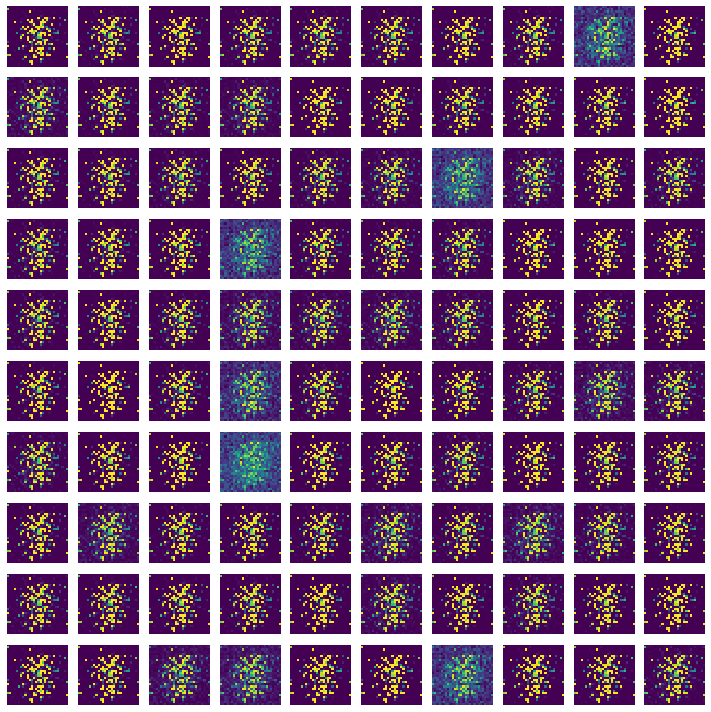

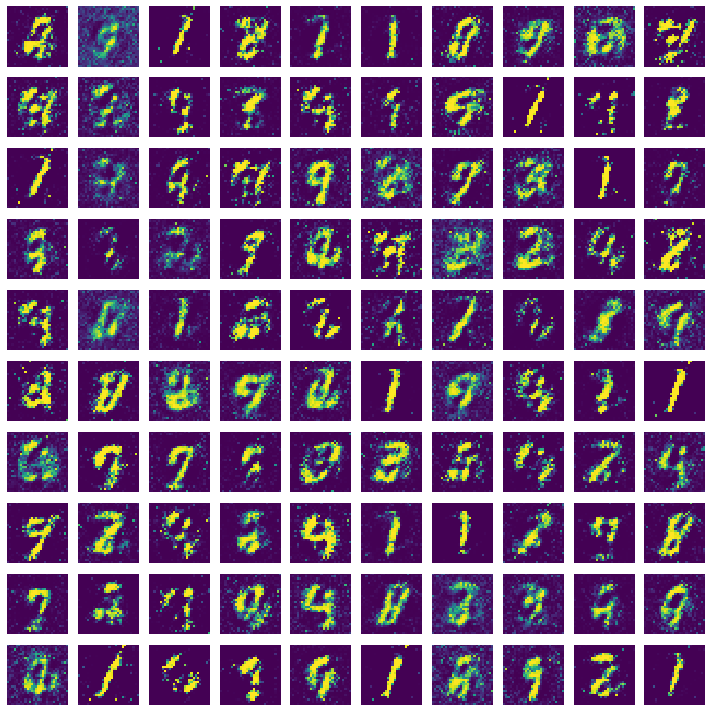

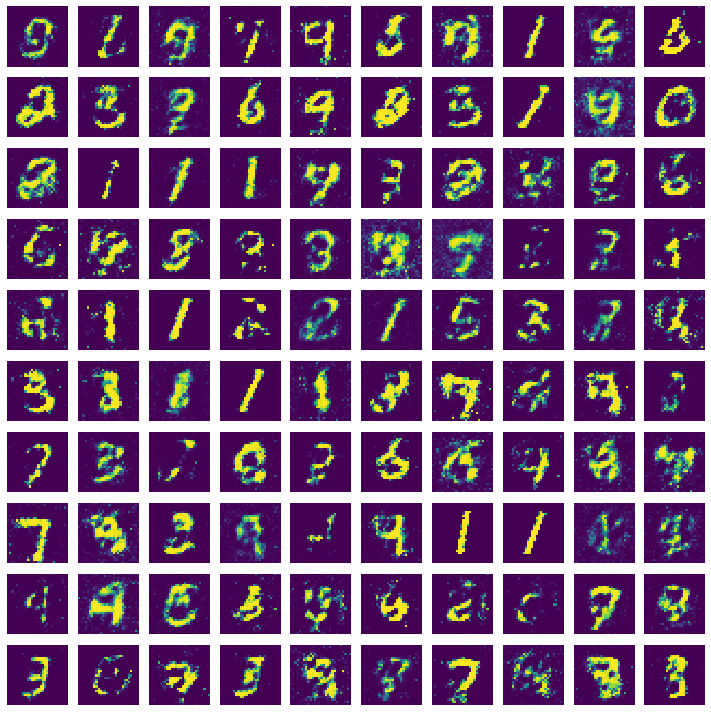

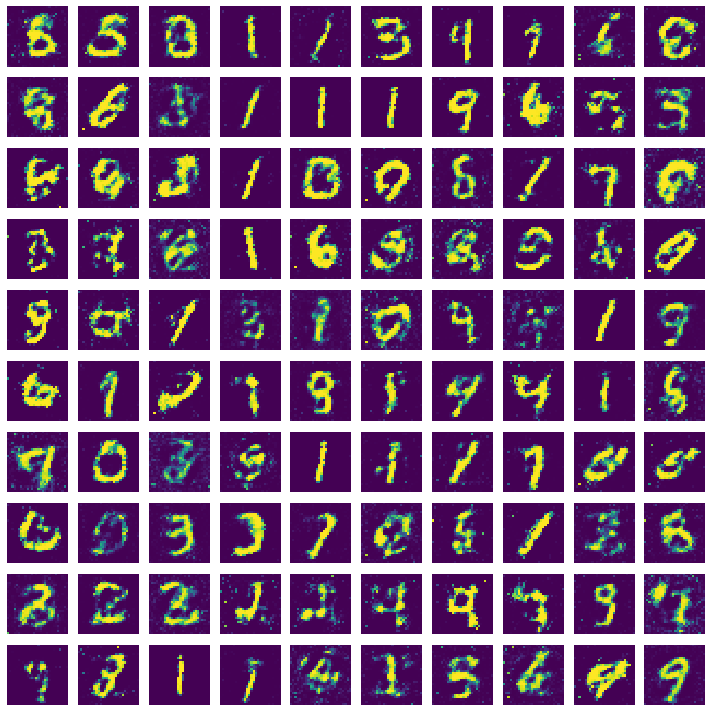

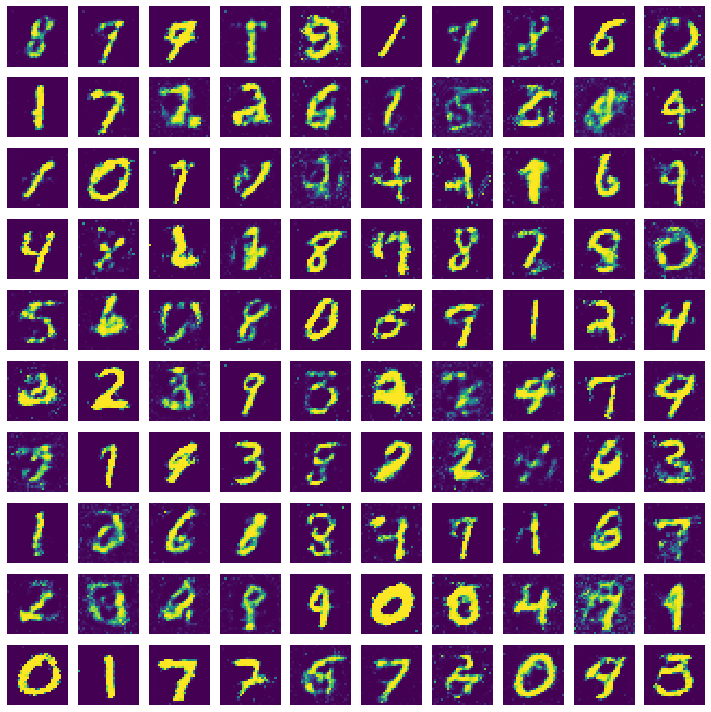

...

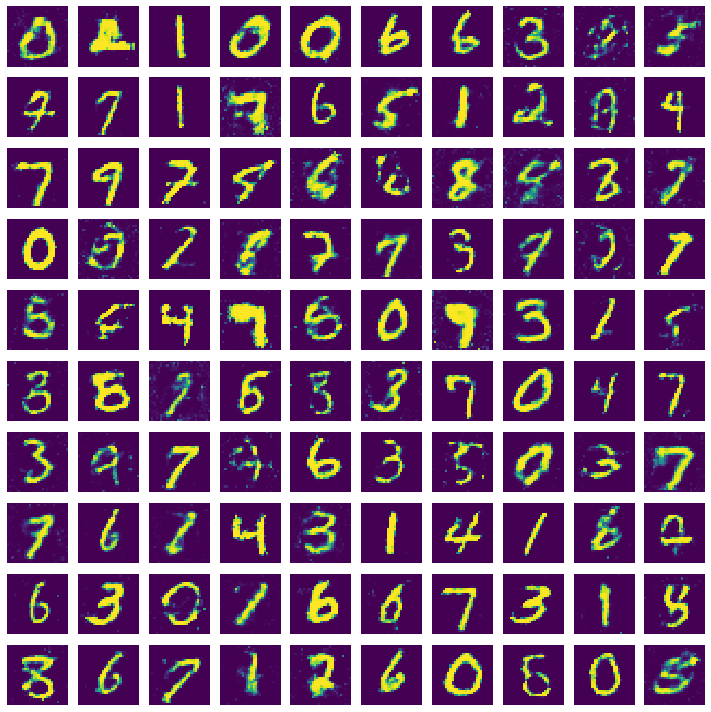

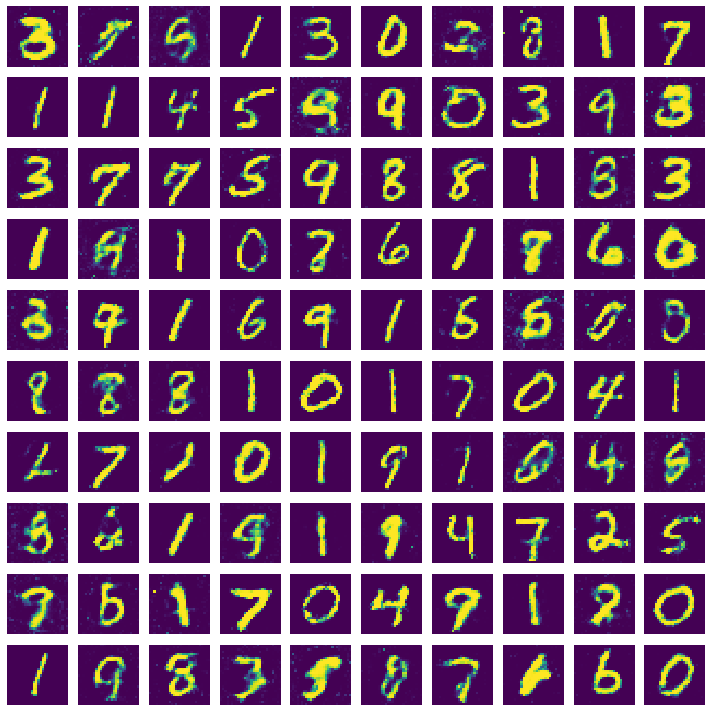

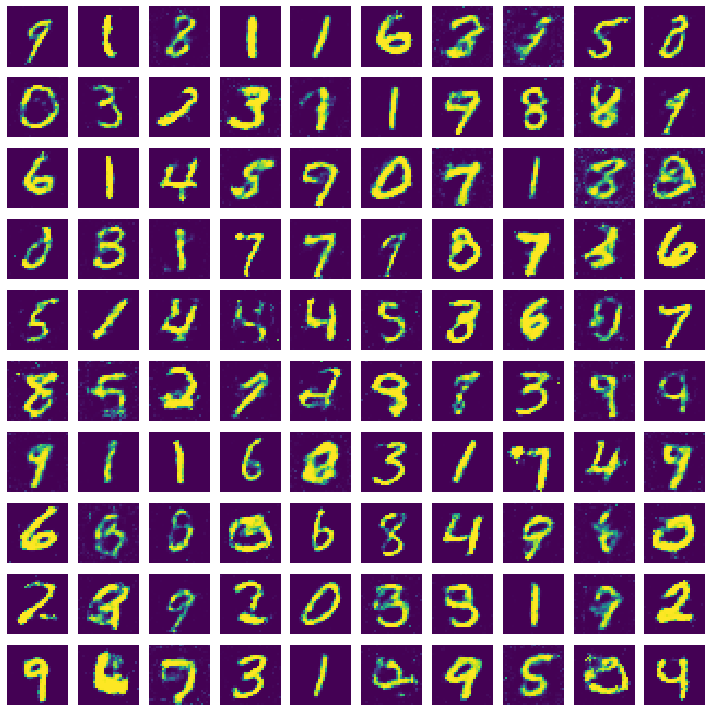

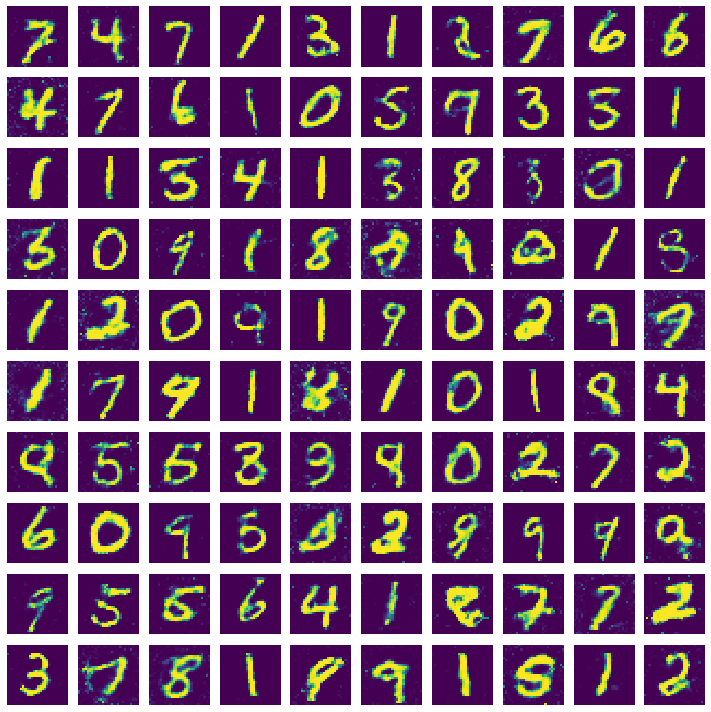

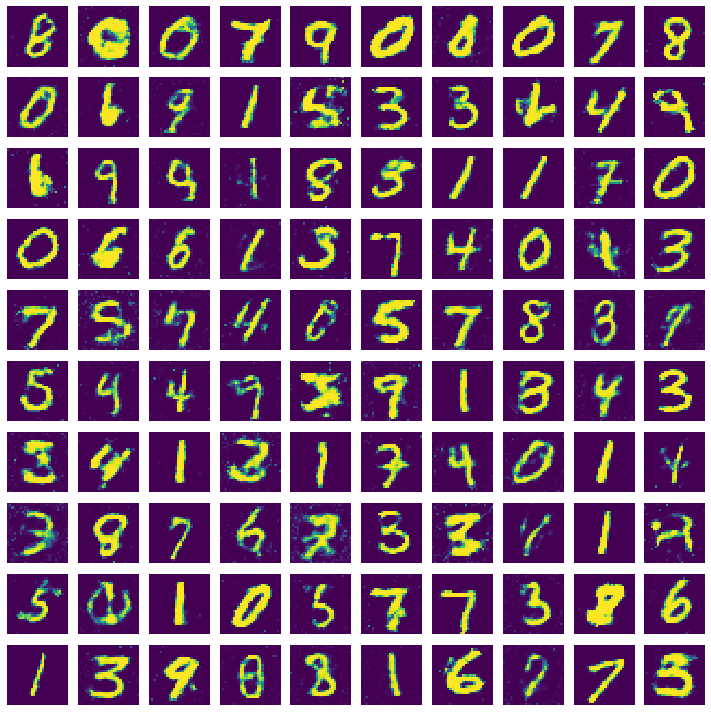

In [18]:
training(400,128)